# Step 1 - Import libraries

In [36]:
# Import libraries and dependencies
import pandas as pd
import numpy as np
import hvplot.pandas
from pathlib import Path
%matplotlib inline
import matplotlib.pyplot as plt

from yahoo_fin.stock_info import *
import yfinance as yf

import vectorbt as vbt

plt.rcParams['figure.figsize'] = (20, 10)
plt.style.use('fivethirtyeight')

import warnings
warnings.filterwarnings('ignore')

import talib
import pickle

# Step 2 - Extracting Data

In [ ]:
stocks=ratio_based_port

In [2]:
# Import ticker data from yahoo finance
stocks = ['APT.AX',
 'REH.AX',
 'XRO.AX',
 'CSL.AX',
 'FMG.AX',
 'AIA.AX',
 'CBA.AX',
 'COH.AX']
stocks_df = yf.download(tickers = stocks, start = "2015-01-01", end = "2019-01-01", interval = "1d", group_by = "ticker")
stocks_df.head()

[*********************100%***********************]  8 of 8 completed


APT.AX                                     CBA.AX             \
             Open High Low Close Adj Close Volume       Open       High   
Date                                                                      
2015-01-02    NaN  NaN NaN   NaN       NaN    NaN  84.959686  85.277962   
2015-01-05    NaN  NaN NaN   NaN       NaN    NaN  85.238182  85.775269   
2015-01-06    NaN  NaN NaN   NaN       NaN    NaN  84.641411  85.337639   
2015-01-07    NaN  NaN NaN   NaN       NaN    NaN  84.850281  85.029312   
2015-01-08    NaN  NaN NaN   NaN       NaN    NaN  85.079041  85.188446   

                                  ... FMG.AX                           AIA.AX  \
                  Low      Close  ...    Low Close Adj Close    Volume   Open   
Date                              ...                                           
2015-01-02  84.661308  85.277962  ...   2.68  2.83  1.716300  24015230   4.19   
2015-01-05  85.049202  85.486832  ...   2.79  2.82  1.710236  17083384   4.14   
2015-01-06  84.412651  84.840332  ...   2.67  2.79  1.692042  25573619   4.10   
2015-01-07  84.094376  84.651360  ...   2.72  2.74  1.661718  10620530   4.19   
2015-01-08  84.671249  84.929848  ...   2.67  2.67  1.619265  21189837   4.19   

                                                
            High   Low Close Adj Close  Volume  
Date                                            
2015-01-02  4.21  4.17  4.21  3.537822    1261  
2015-01-05  4.18  4.11  4.12  3.462193   23281  
2015-01-06  4.13  4.02  4.11  3.453789  184256  
2015-01-07  4.19  4.13  4.13  3.470596   99275  
2015-01-08  4.19  4.14  4.14  3.478999    5453  

[5 rows x 48 columns]

# Step 3 - MACD calculation

In [3]:
# Calculate MACD data and add to dictionary
macd_list = {}
for stock in stocks:
    # MACD data
    ewm_fast = stocks_df[stock, "Close"].ewm(span = 12, adjust = False).mean()
    ewm_slow = stocks_df[stock, "Close"].ewm(span = 26, adjust = False).mean()
    macd = pd.DataFrame(ewm_fast - ewm_slow)
    macd = macd.rename(columns = {"Close":"macd"})
    # Signal data
    signal = pd.DataFrame(macd[stock, "macd"].ewm(span = 9, adjust = False).mean()).rename(columns = {"macd":"signal"})
    # Histogram data
    histogram = pd.DataFrame(macd[stock, "macd"] - signal[stock, "signal"]).rename(columns = {0:(stock, "hist")})
    ticker_macd = pd.concat([macd, signal, histogram], join = "inner", axis = 1)
    macd_list[stock] = ticker_macd

# Step 4 - Plot MACD data

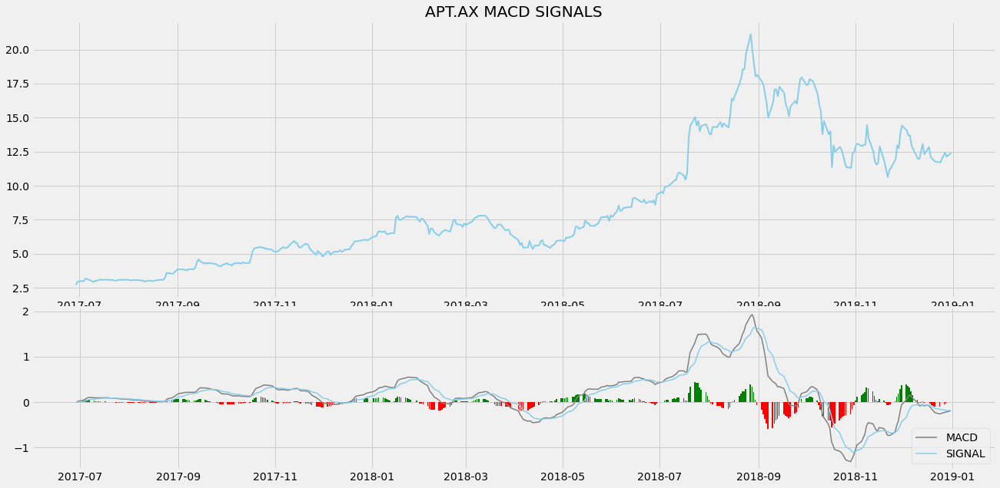

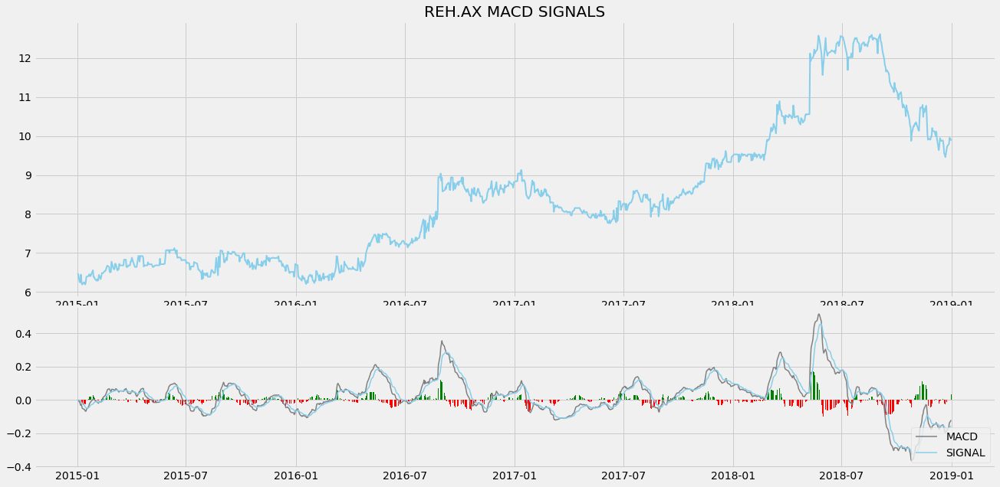

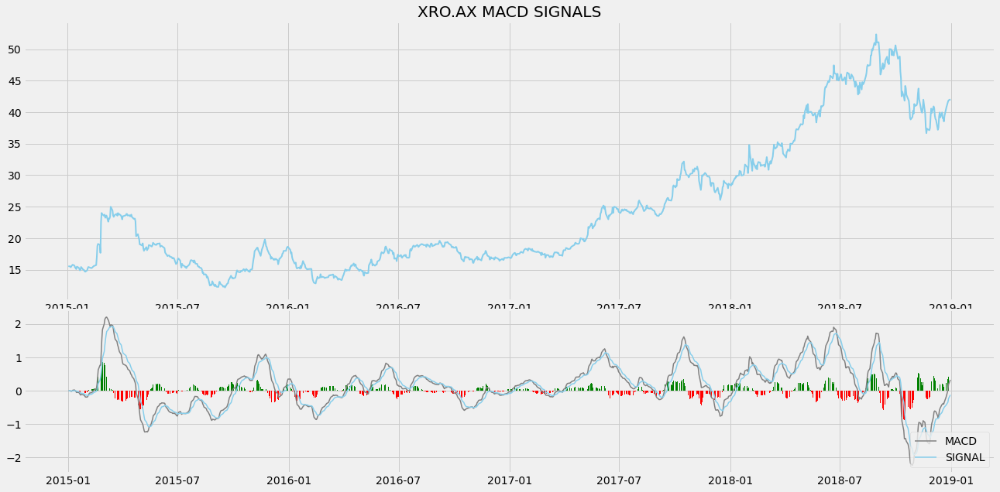

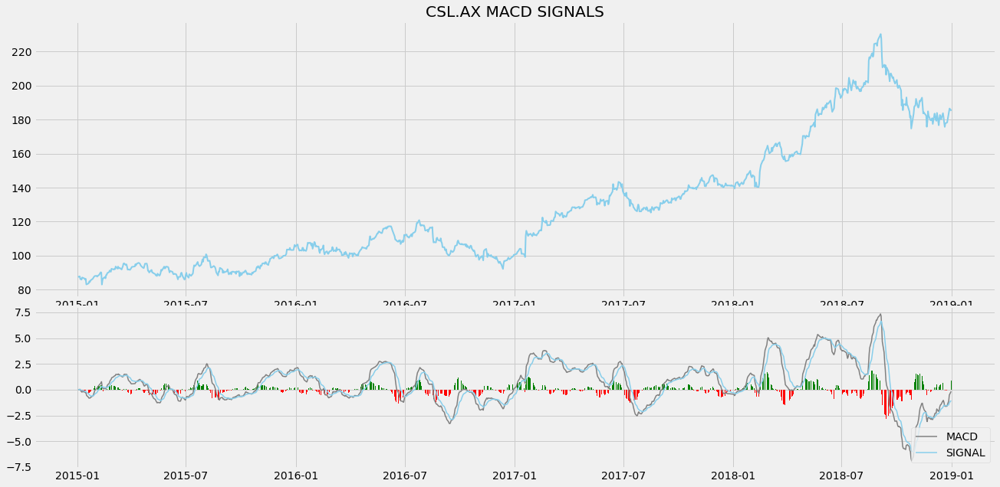

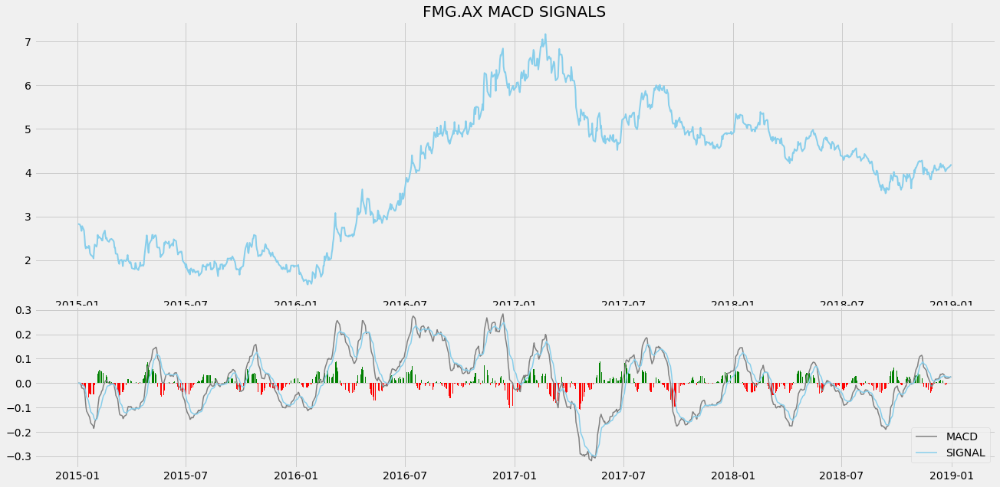

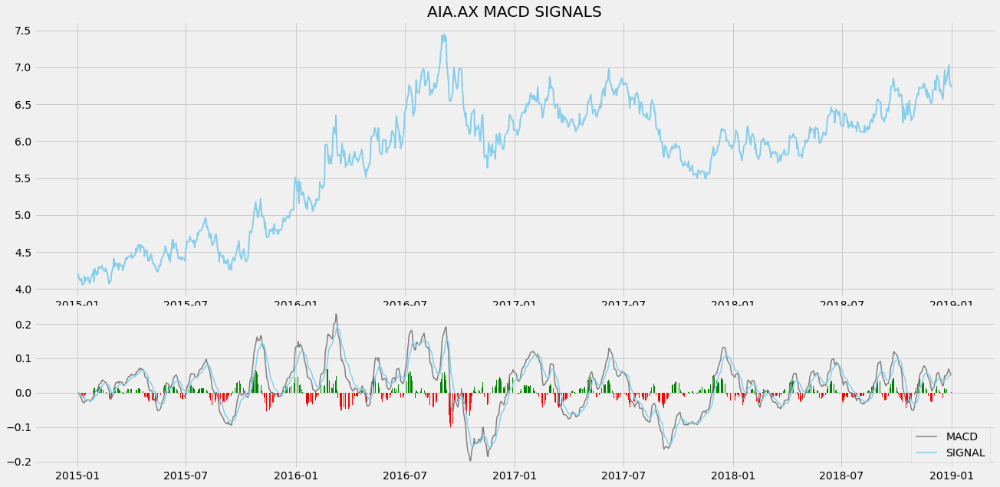

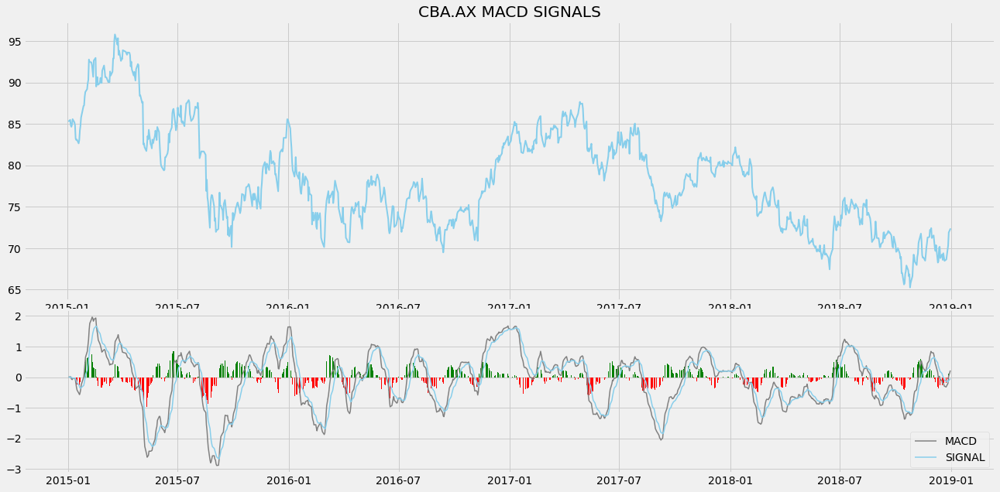

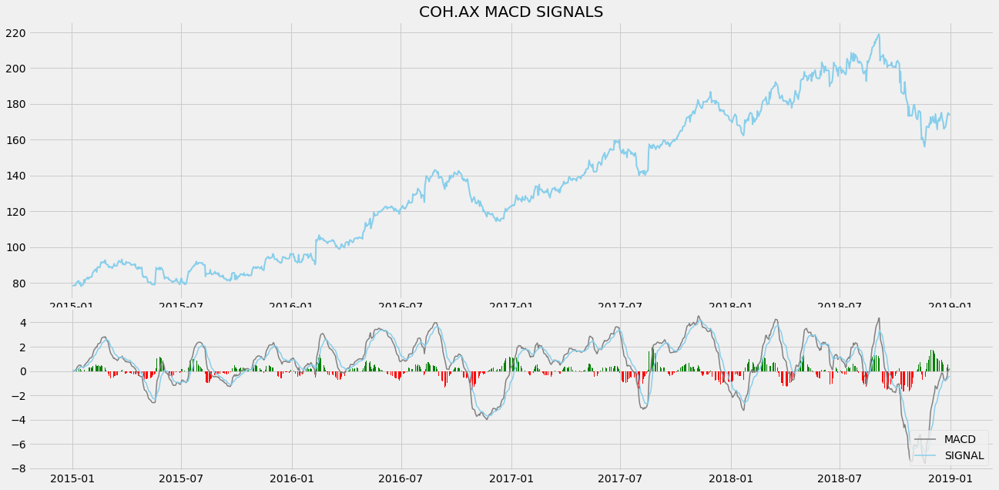

In [4]:
# Plot MACD data per individual stock
for stock in stocks:            
    ax1 = plt.subplot2grid((8,1), (0,0), rowspan = 5, colspan = 1)
    ax2 = plt.subplot2grid((8,1), (5,0), rowspan = 3, colspan = 1)

    ax1.plot(stocks_df[stock]["Close"], color = 'skyblue', linewidth = 2, label = stock)
    
    ax1.set_title(f'{stock} MACD SIGNALS')
    ax2.plot(macd_list[stock][stock]['macd'], color = 'grey', linewidth = 1.5, label = 'MACD')
    ax2.plot(macd_list[stock][stock]['signal'], color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')

    for i in range(len(macd_list[stock][stock])):
        if str(macd_list[stock][stock]['hist'][i])[0] == '-':
            ax2.bar(macd_list[stock][stock].index[i], macd_list[stock][stock]['hist'][i], color = 'red')
        else:
            ax2.bar(macd_list[stock][stock].index[i], macd_list[stock][stock]['hist'][i], color = 'green')
    
    plt.legend(loc = 'lower right')
    plt.show()

# Step 5 - Create the Trading strategy

In [5]:
# Create Trading Strategy function
def implement_macd_strategy(prices, data):    
    buy_price = []
    sell_price = []
    macd_signal = []
    signal = 0

    # For loop for range of dates
    for i in range(len(data)):
        # Conditional produce signal to buy stock
        if data['macd'][i] > data['signal'][i]:
            if signal != 1:
                buy_price.append(prices[i])
                sell_price.append(np.nan)
                signal = 1
                macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                macd_signal.append(0)
        # Conditional produce signal to sell stock
        elif data['macd'][i] < data['signal'][i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(prices[i])
                signal = -1
                macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                macd_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            macd_signal.append(0)
            
    return buy_price, sell_price, macd_signal

# Step 6 - Plotting the Trading lists

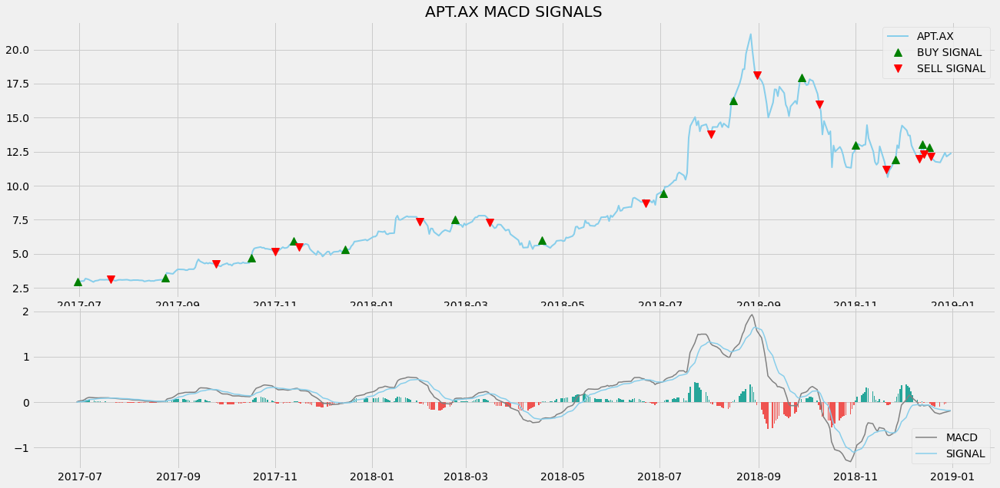

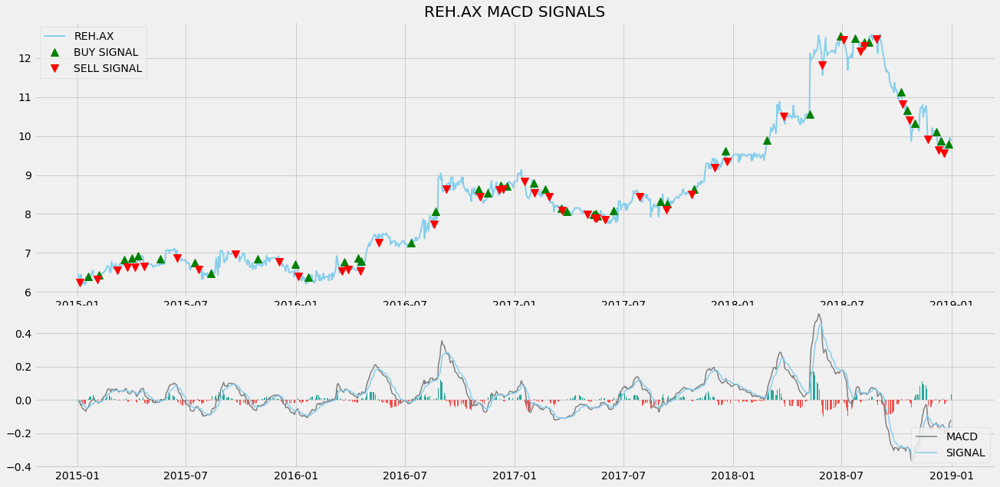

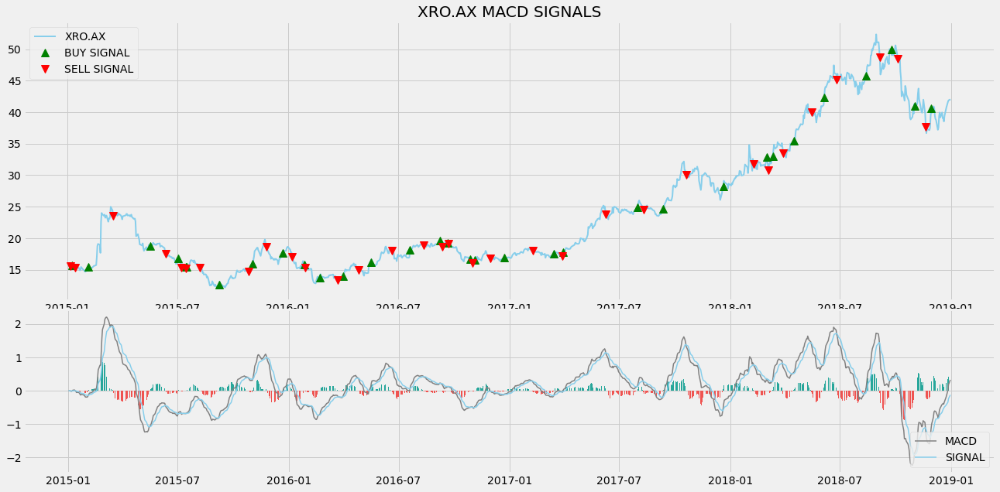

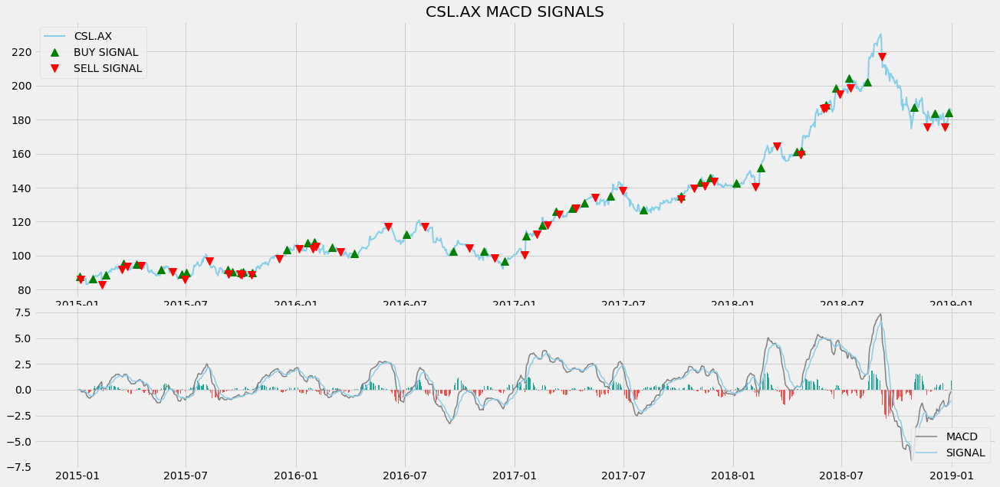

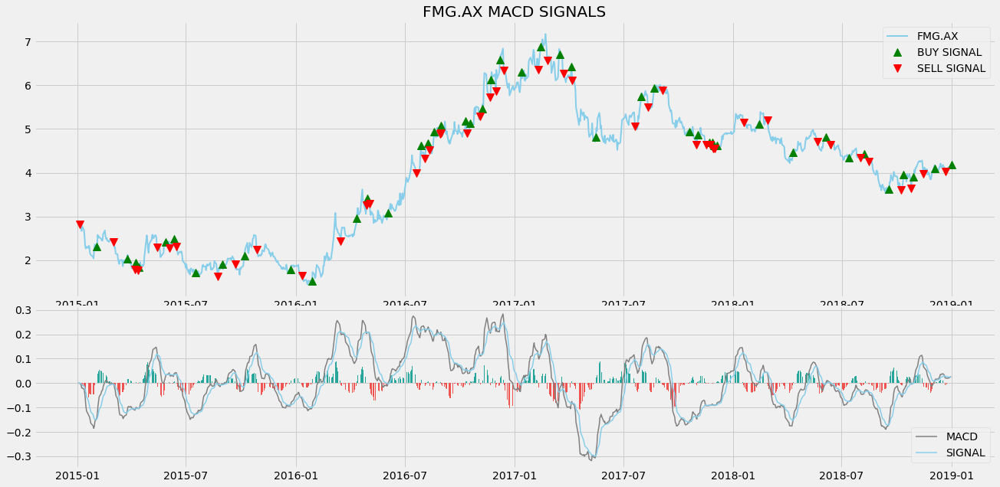

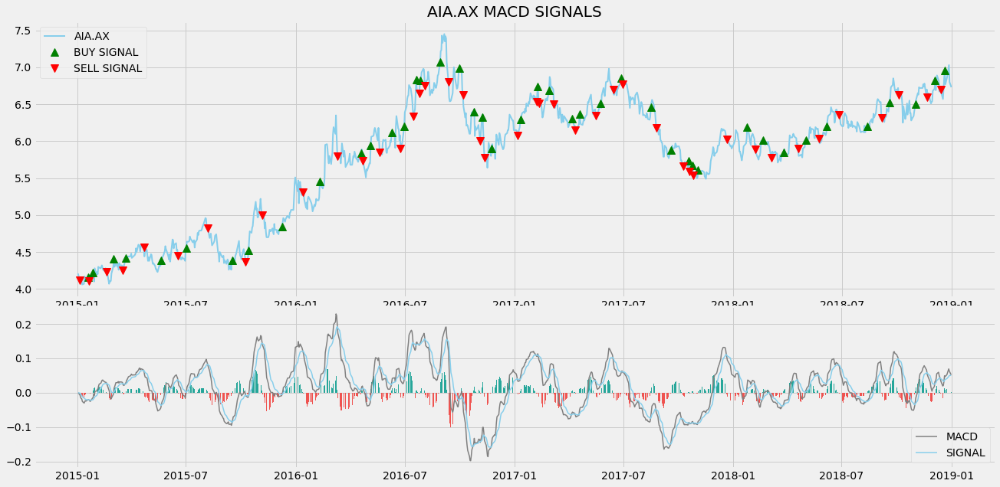

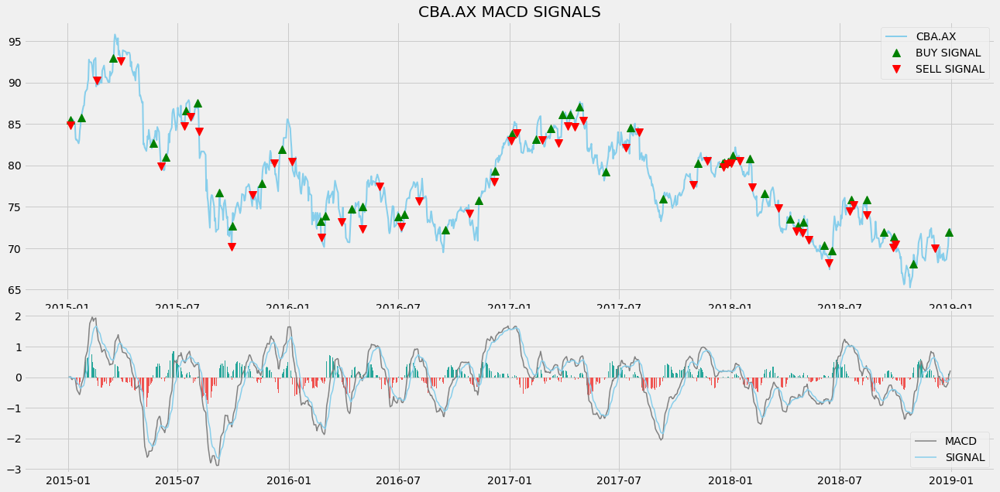

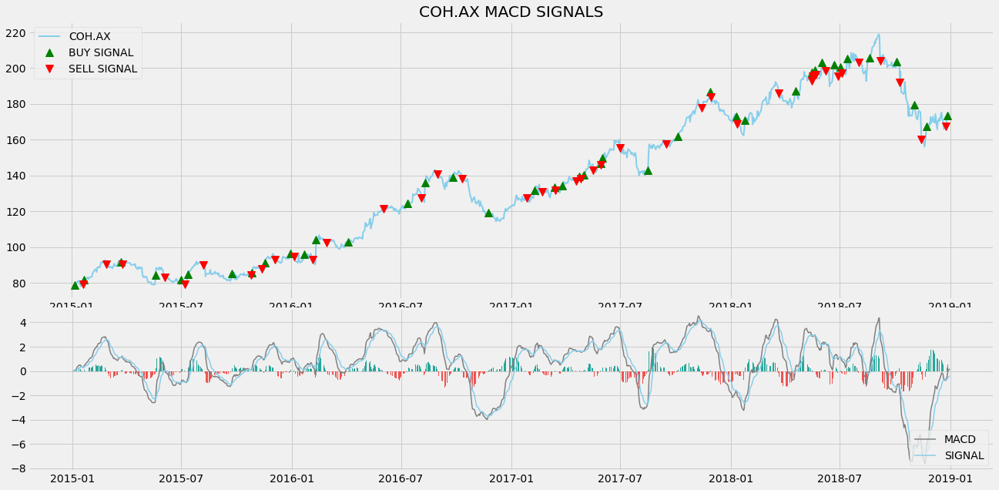

In [6]:
# Run trade strategy and plot buy and sell signals
for stock in stocks:            
    buy_price, sell_price, macd_signal = implement_macd_strategy(stocks_df[stock]["Close"], macd_list[stock][stock])

    ax1 = plt.subplot2grid((8,1), (0,0), rowspan = 5, colspan = 1)
    ax2 = plt.subplot2grid((8,1), (5,0), rowspan = 3, colspan = 1)

    ax1.plot(stocks_df[stock]["Close"], color = 'skyblue', linewidth = 2, label = stock)
    ax1.plot(stocks_df[stock]["Close"].index, buy_price, marker = '^', color = 'green', markersize = 10, label = 'BUY SIGNAL', linewidth = 0)
    ax1.plot(stocks_df[stock]["Close"].index, sell_price, marker = 'v', color = 'r', markersize = 10, label = 'SELL SIGNAL', linewidth = 0)
    ax1.legend()
    ax1.set_title(f'{stock} MACD SIGNALS')
    ax2.plot(macd_list[stock][stock]['macd'], color = 'grey', linewidth = 1.5, label = 'MACD')
    ax2.plot(macd_list[stock][stock]['signal'], color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')

    for i in range(len(macd_list[stock][stock])):
        if str(macd_list[stock][stock]['hist'][i])[0] == '-':
            ax2.bar(macd_list[stock][stock].index[i], macd_list[stock][stock]['hist'][i], color = '#ef5350')
        else:
            ax2.bar(macd_list[stock][stock].index[i], macd_list[stock][stock]['hist'][i], color = '#26a69a')
        
    plt.legend(loc = 'lower right')
    plt.show()

# Step 7 - Create position on stock

In [7]:
# Run strategy to create position
stock_strategy = {}

for stock in stocks:            
    buy_price, sell_price, macd_signal = implement_macd_strategy(stocks_df[stock]["Close"], macd_list[stock][stock])

    position = []
    for i in range(len(macd_signal)):
        if macd_signal[i] > 1:
            position.append(0)
        else:
            position.append(1)
            
    for i in range(len(stocks_df[stock]['Close'])):
        if macd_signal[i] == 1:
            position[i] = 1
        elif macd_signal[i] == -1:
            position[i] = 0
        else:
            position[i] = position[i-1]
            
    macd = macd_list[stock][stock]['macd']
    signal = macd_list[stock][stock]['signal']
    close_price = stocks_df[stock]["Close"]
    macd_signal = pd.DataFrame(macd_signal).rename(columns = {0:'macd_signal'}).set_index(stocks_df[stock]["Close"].index)
    position = pd.DataFrame(position).rename(columns = {0:'macd_position'}).set_index(stocks_df[stock]["Close"].index)

    frames = [close_price, macd, signal, macd_signal, position]
    strategy = pd.concat(frames, join = 'inner', axis = 1)

    stock_strategy[stock] = strategy

In [8]:
stock_strategy

{'APT.AX':             Close      macd    signal  macd_signal  macd_position
 Date                                                             
 2015-01-02    NaN       NaN       NaN            0              1
 2015-01-05    NaN       NaN       NaN            0              1
 2015-01-06    NaN       NaN       NaN            0              1
 2015-01-07    NaN       NaN       NaN            0              1
 2015-01-08    NaN       NaN       NaN            0              1
 ...           ...       ...       ...          ...            ...
 2018-12-21  11.76 -0.229626 -0.133541            0              0
 2018-12-24  11.71 -0.261242 -0.159081            0              0
 2018-12-27  12.42 -0.226396 -0.172544            0              0
 2018-12-28  12.14 -0.218852 -0.181806            0              0
 2018-12-31  12.40 -0.189707 -0.183386            0              0
 
 [1013 rows x 5 columns],
 'REH.AX':                Close      macd    signal  macd_signal  macd_position
 Date      

# Step 8 - Backtesting

In [9]:
# Create dictionary and populate according to macd_signal
stock_signals = {}

for stock in stocks:
    entries = []
    exits = []
    for sig in stock_strategy[stock]["macd_signal"]:
        if sig == -1:
            entries.append("False")
            exits.append("True")
        elif sig == 1:
            entries.append("True")
            exits.append("False")
        else:
            entries.append("False")
            exits.append("False")
    entries = pd.Series(entries, index = stocks_df[stock]["Close"].index)
    exits = pd.Series(exits, index = stocks_df[stock]["Close"].index)
    # Change type to bool
    entries = entries == "True"
    exits = exits == "True"
    # Create dataframe
    entries = pd.DataFrame(entries).rename(columns = {0:'entries'}).set_index(stocks_df[stock]["Close"].index)
    exits = pd.DataFrame(exits).rename(columns = {0:'exits'}).set_index(stocks_df[stock]["Close"].index)
    close_price = stocks_df[stock]["Close"]
    frames = [close_price, entries, exits]
    signals = pd.concat(frames, join = 'inner', axis = 1)

    stock_signals[stock] = signals

In [11]:
# Individual stock close price
#price = stocks_df["AAPL"]["Close"]
init_cash = 100000

In [14]:
# Produce total profit earned from holding stock
price = vbt.YFData.download(stocks, period='6mo', missing_index='drop').get('Close')
portfolio = vbt.Portfolio.from_holding(price, init_cash = init_cash)
portfolio.total_profit()

symbol
APT.AX     3815.760197
REH.AX    50609.295939
XRO.AX    -4587.480574
CSL.AX    -1520.403527
FMG.AX     8006.819245
AIA.AX    -7503.233147
CBA.AX    24745.916437
COH.AX    13719.879305
Name: total_profit, dtype: float64

In [16]:
total_profit = []

for stock in stocks:
    # Build portfolio using macd signals
    portfolio = vbt.Portfolio.from_signals(stock_signals[stock]["Close"], stock_signals[stock]["entries"], stock_signals[stock]["exits"], init_cash = init_cash)

    # Produce total profit earned from using MACD signals for trades
    total_profit.append(portfolio.total_profit())

In [17]:
print(f"Portfolio returned total profit of ${sum(total_profit):.4}")

Portfolio returned total profit of $5.471e+05


In [27]:
start = '2020-01-01 UTC'  
end =  '2021-05-31 UTC'

In [29]:
ohlcv = vbt.YFData.download(stocks, start=start, end=end).concat()

In [42]:
# OHLC pattern recognition

In [34]:
result = pd.DataFrame.vbt.empty_like(ohlcv['Open'], fill_value=0.)
for pattern in talib.get_function_groups()['Pattern Recognition']:
     PRecognizer = vbt.IndicatorFactory.from_talib(pattern)
     pr = PRecognizer.run(ohlcv['Open'], ohlcv['High'], ohlcv['Low'], ohlcv['Close'])
     result = result + pr.integer

 # Don't look into future
result = result.vbt.fshift(1)

size = result / ohlcv['Open']
# Simulate portfolio
portfolio = vbt.Portfolio.from_orders(
     ohlcv['Close'], size, price=ohlcv['Open'],
     init_cash='autoalign', fees=0.001, slippage=0.001)

 # Visualize portfolio value
portfolio.value().vbt.plot()

FigureWidget({
    'data': [{'name': 'APT.AX',
              'showlegend': True,
              'type': 'scatte…

In [ ]:
# window hyperparameter dual SMA

In [47]:
price = vbt.YFData.download(stocks, missing_index='drop').get('Close')

windows = np.arange(2, 101)
fast_ma, slow_ma = vbt.MA.run_combs(price, window=windows, r=2, short_names=['fast', 'slow'])
entries = fast_ma.ma_above(slow_ma, crossover=True)
exits = fast_ma.ma_below(slow_ma, crossover=True)

portfolio_kwargs = dict(size=np.inf, fees=0.001, freq='1D')
portfolio = vbt.Portfolio.from_signals(price, entries, exits, **portfolio_kwargs)

fig = portfolio.total_return().vbt.heatmap(
    x_level='fast_window', y_level='slow_window', slider_level='symbol', symmetric=True,
    trace_kwargs=dict(colorbar=dict(title='Total return', tickformat='%')))
fig.show()